# Lightning Cloning 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random 
import pandas as pd
from IPython.display import HTML

#### Formatting The Plot

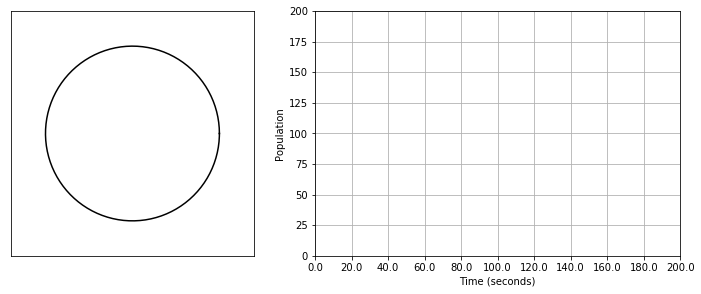

In [2]:
t = 200
f = t*50

fig = plt.figure(figsize = (12, 4.5))
(clonePlot, numPartPlot) = fig.subplots(1, 2, gridspec_kw = {'width_ratios':[2, 3]})

clonePlot.set_xlim([-7, 7])
clonePlot.set_ylim([-7, 7])
numPartPlot.set_xlim([0, f])
numPartPlot.set_ylim([25, 200])

numPartPlot.grid()

clonePlot.set_xticks([])
clonePlot.set_yticks([])

numPartPlot.set_xticks(np.linspace(0, f, 11))
numPartPlot.set_xticklabels(np.linspace(0, t, 11))
numPartPlot.set_yticks([0, 25, 50, 75, 100, 125, 150, 175, 200])

numPartPlot.set_xlabel('Time (seconds)')
numPartPlot.set_ylabel('Population')

thetaCircle = np.linspace(0, 2*np.pi, 200)
circle = clonePlot.plot(5*np.cos(thetaCircle), 5*np.sin(thetaCircle), color = 'black')

growingPlot, = numPartPlot.plot([], [], color = 'blue')
xPlotData = []
yPlotData = []

#### Animation Functions

In [3]:
def createParticles(numberOfParticles):
    global particlePosition, particleDirection, particleTheta, totalParticles, particles, numParticles, lightning
   
    numParticles = numberOfParticles
    particlePosition = []
    particleDirection = []
    particleTheta = []
    
    particleXPosition = []
    particleYPosition = []
    
    i = 0 
    while i in range(numParticles):
        
        xP = round(random.uniform(-4, 4), 2)
        yP = round(random.uniform(-4, 4), 2)
        while xP**2 + yP**2 >= 25:
            yP = round(random.uniform(-4, 4), 2)
        particlePosition.append([xP, yP])
        
        particleXPosition.append(xP)
        particleYPosition.append(yP)
        
        thetaD = round(random.uniform(0, 2*np.pi), 2)
        xD = np.cos(thetaD)
        yD = np.sin(thetaD)
        particleDirection.append([xD, yD])
        particleTheta.append(thetaD)
        
        i = i + 1

    particles, = clonePlot.plot(particleXPosition, particleYPosition, 'bo', markersize = 3)
    totalParticles = clonePlot.text(2.5, 4.5, str(numParticles), size = 40)
    
    lightning, = clonePlot.plot(0, 0, 'ro', markersize = 10)

    
createParticles(25)

def forward(position, direction):
    position = [position[0] + (direction[0]*0.08), position[1] + (direction[1]*0.08)]
    return position

def reflection(position, direction):
    n = [position[0]/np.sqrt(position[0]**2 + position[1]**2),     position[1]/np.sqrt(position[0]**2 + position[1]**2)]
    v = direction
    reflection = np.add(v, np.multiply((-2)*(np.dot(n, v)), n))
    d = reflection.tolist()
    
    newDirection = [d[0]/np.sqrt(d[0]**2 + d[1]**2), d[1]/np.sqrt(d[0]**2 + d[1]**2)]
    return newDirection

def update(particles, updatedPosition):
    particleXPosition = []
    particleYPosition = []
    for particle in updatedPosition:
        particleXPosition.append(particle[0])
        particleYPosition.append(particle[1])
    particles.set_data(particleXPosition, particleYPosition)

def init():
    
    particles.set_data([], [])
    totalParticles.set_text(str(numParticles))
    lightning.set_data([], [])
    
    return particles, totalParticles



time = []
dataNum = []


def animate(i):
    
    global numParticles, particlePosition, particleDirection, xPlotData, yPlotData, lightning

    babies = []
    newCount = 0
    if i % 50 == 0:
        xP = round(random.uniform(-4.5, 4.5), 2)
        yP = round(random.uniform(-4.5, 4.5), 2)
        while xP**2 + yP**2 >= 20.25:
            yP = round(random.uniform(-4.5, 4.5), 2)
        lightning.set_data(xP, yP)
        for j in range(len(particlePosition)):
            if np.sqrt((xP - particlePosition[j][0])**2 + (yP - particlePosition[j][1])**2) <= 0.5:
                babies.append([particlePosition[j][0], particlePosition[j][1]])
                thetaD = round(random.uniform(0, 2*np.pi), 2)
                xD = np.cos(thetaD)
                yD = np.sin(thetaD)
                particleDirection.append([xD, yD])
                newCount = newCount + 1
                

        particlePosition.extend(babies)
        numParticles = numParticles + newCount
        totalParticles.set_text(str(numParticles))
        
        time.append(i/50)
        dataNum.append(numParticles)
        

        
    if i % 50 == 30:
        lightning.set_data([], [])
    
    for j in range(len(particlePosition)):
        particlePosition[j] = forward(particlePosition[j], particleDirection[j])
        if (particlePosition[j][0]**2 + particlePosition[j][1]**2) >= 25:
            particleDirection[j] = reflection(particlePosition[j], particleDirection[j])
        
        
    update(particles, particlePosition)

    xPlotData.append(i)
    yPlotData.append(numParticles)
    growingPlot.set_data(xPlotData, yPlotData)

    
    return particles, totalParticles, growingPlot, lightning

        


In [4]:
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=f, interval = 20, blit = True, repeat = False)
HTML(anim.to_html5_video())

#### The Data

In [5]:
datadict = {'time (s)': time, 'number of particles': dataNum}
df = pd.DataFrame(data = datadict)

print(df.to_string(index = False))

 time (s)  number of particles
      0.0                   25
      1.0                   25
      2.0                   27
      3.0                   27
      4.0                   27
      5.0                   28
      6.0                   28
      7.0                   28
      8.0                   28
      9.0                   29
     10.0                   29
     11.0                   30
     12.0                   30
     13.0                   30
     14.0                   30
     15.0                   30
     16.0                   30
     17.0                   30
     18.0                   30
     19.0                   31
     20.0                   32
     21.0                   32
     22.0                   32
     23.0                   32
     24.0                   34
     25.0                   34
     26.0                   34
     27.0                   34
     28.0                   34
     29.0                   34
     30.0                   34
     31.

#### Plotting The Data and Theoretical Curve   

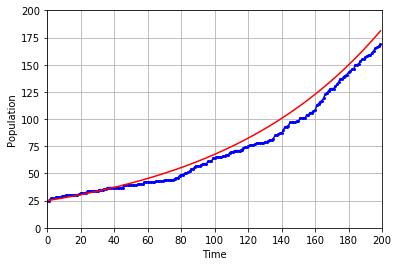

In [6]:
# Plotting Data
timeList = np.asarray(df['time (s)'])
particleCountList = np.asarray(df['number of particles'])
plt.plot(timeList, particleCountList, 'b-o', markersize = 2)

# Plotting Exponential Decay Curve
exp = 25*(1.01**timeList)
plt.plot(timeList, exp, 'r-')

# Formatting Plot
plt.xlabel('Time')
plt.ylabel('Population')
plt.grid()
plt.xlim(0, t)
plt.ylim(0, 200)
plt.xticks(np.linspace(0, t, 11))


plt.show()

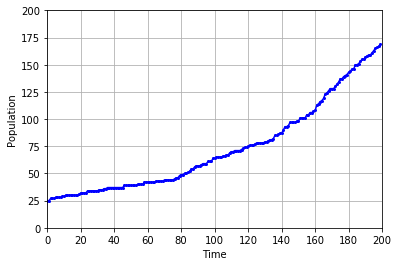

In [7]:
# Plotting Data
timeList = np.asarray(df['time (s)'])
particleCountList = np.asarray(df['number of particles'])
plt.plot(timeList, particleCountList, 'b-o', markersize = 2)

# Formatting Plot
plt.xlabel('Time')
plt.ylabel('Population')
plt.grid()
plt.xlim(0, t)
plt.ylim(0, 200)
plt.xticks(np.linspace(0, t, 11))
plt.show()